In [6]:
import numpy as np
import pandas as pd

sound_data = pd.read_csv('../datasets/jrelabeled1298.csv')
X = sound_data.drop(['filename', 'label', 'label2'], axis=1)
y = sound_data['label2']
sound_data.head()

,filename,chroma_stft,rmse,spectral_centroid,spectral_bandwidth,rolloff,zero_crossing_rate,mfcc1,mfcc2,mfcc3,...,mfcc13,mfcc14,mfcc15,mfcc16,mfcc17,mfcc18,mfcc19,mfcc20,label,label2
0,jre11692500_1002.wav,0.370643,0.060327,2311.597408,1842.221912,4046.746826,0.141018,-244.242737,101.293144,-26.639498,...,-17.581421,0.219237,-15.416845,-2.527660,-6.503064,-7.859387,-11.159444,-1.384048,1,1
1,jre11692500_1004.wav,0.334566,0.049869,1939.228643,2043.361318,3735.312907,0.081312,-311.681519,95.534386,-9.830963,...,-21.340956,-0.276192,-9.889625,-7.471118,-8.896070,-5.014895,-4.136333,-4.388417,1,1
2,jre11692500_1006.wav,0.349033,0.037965,1853.812744,1790.238071,3456.477865,0.091679,-288.414154,126.246300,-12.794884,...,-12.223885,2.816964,-8.079397,-3.590029,-8.260034,-4.544590,-6.480252,-5.387292,-1,1
3,jre11692500_1007.wav,0.352053,0.048932,2170.699733,1890.509107,3965.598551,0.120795,-289.390564,98.574074,-11.574970,...,-19.094336,1.818855,-9.331707,-2.967143,-12.409453,-6.876427,-4.118853,-3.872151,1,1
4,jre11692500_1009.wav,0.349883,0.048066,1572.637537,1701.640398,2895.817057,0.073938,-297.128540,137.961060,-21.671207,...,-10.068391,1.245310,-10.639617,-0.519561,-4.097899,-4.806003,-8.309758,0.091142,-1,1


In [94]:
from sklearn.ensemble import RandomForestClassifier

rf = RandomForestClassifier()
rf.fit(X, y)


scores = [{"name":name, "score":score} for name, score in zip(X.keys(), rf.feature_importances_)]
scores = sorted(scores, key=lambda x: x['score'], reverse=True)
scores[:10]

[{'name': 'mfcc13', 'score': 0.17796040020021384},
 {'name': 'rmse', 'score': 0.15058216326943732},
 {'name': 'mfcc16', 'score': 0.10996951985636906},
 {'name': 'mfcc10', 'score': 0.08714629170893361},
 {'name': 'mfcc17', 'score': 0.08383328243405092},
 {'name': 'chroma_stft', 'score': 0.08095816590145682},
 {'name': 'mfcc20', 'score': 0.05572615500564318},
 {'name': 'spectral_bandwidth', 'score': 0.05429709225881822},
 {'name': 'mfcc18', 'score': 0.03524862717759671},
 {'name': 'mfcc1', 'score': 0.0322016837398202}]

In [57]:
from sklearn.decomposition import PCA
from sklearn.preprocessing import StandardScaler

st = StandardScaler()
sX = st.fit_transform(X)

pca = PCA(n_components=0.95)
X_pca = pca.fit_transform(sX)

In [61]:
len(pca.explained_variance_ratio_)

15

In [63]:
def reconstruction_error(pca, X):
    X_pca = pca.transform(X)
    X_recon = pca.inverse_transform(X_pca)
    mse = np.square(X_recon-X).mean(axis=-1)
    return mse

reconstruction_error(pca, sX).mean()

0.04564607788492149

In [76]:
rogan = X[y == 1]
elon = X[y == 0]

rogan_scaler = StandardScaler()
rogan_S = rogan_scaler.fit_transform(rogan)
elon_S = rogan_scaler.transform(elon)

rogan_PCA = PCA(n_components=0.95)
rogan_pca = rogan_PCA.fit_transform(rogan_S)
elon_pca = rogan_PCA.transform(elon_S)

In [79]:
print(reconstruction_error(rogan_PCA, rogan_S).mean())
print(reconstruction_error(rogan_PCA, elon_S).mean())

0.04127878831551388
0.16145273451641406


In [80]:
def error_for_sample(samples):
    samples_S = rogan_scaler.transform(samples)
    return reconstruction_error(rogan_PCA, samples_S)

In [93]:
error_for_sample(rogan.sample(1))

array([0.04398569])

In [98]:
climate_data = pd.read_csv('../datasets/climate2500.csv')

In [120]:
dm_data = pd.read_csv('../datasets/rogandmt_dataset.csv')

In [133]:
import librosa
import IPython.display as ipd

samples = dm_data.sample(1)

for sample in samples.filename:
    
    print(sample)
    audio = f'../audio/rogandmt/{sample}'
    ipd.display(ipd.Audio(audio))
    
print(error_for_sample(samples.drop(['filename', 'label'], axis=1)))

rogandmt32.wav


[0.08862398]


In [136]:
dm_errors = error_for_sample(dm_data.drop(['filename', 'label'], axis=1))
pd.Series(dm_errors).describe()

count    119.000000
mean       0.078922
std        0.084490
min        0.007657
25%        0.030712
50%        0.053744
75%        0.090701
max        0.598389
dtype: float64

In [148]:
for sample in dm_data[dm_errors>0.15].filename[:3]:
    
    print(sample)
    audio = f'../audio/rogandmt/{sample}'
    ipd.display(ipd.Audio(audio))

rogandmt0.wav


rogandmt101.wav


rogandmt102.wav


# K-Means

In [164]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

inertias = []
sils = []

cdata = rogan_PCA.transform(dm_data.drop(['filename', 'label'], axis=1))
for k in range(2, 40):
    kmeans = KMeans(n_clusters=k).fit(cdata)
    inertias.append(kmeans.inertia_)
    sils.append(silhouette_score(cdata, kmeans.labels_))

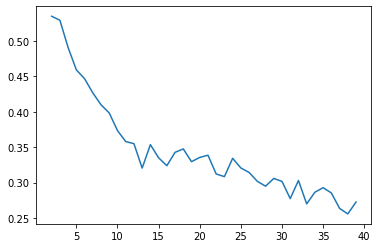

In [165]:
import seaborn as sns

sns.lineplot(x=range(2, 40), y=sils)

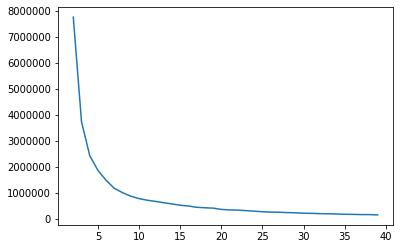

In [166]:
sns.lineplot(x=range(2, 40), y=inertias)

In [178]:
kmeans = KMeans(n_clusters=5)
c_transformed = kmeans.fit_transform(cdata)
c_representitive = np.argmin(c_transformed, axis=0)

for sample in dm_data.iloc[c_representitive].filename[:]:
    
    print(sample)
    audio = f'../audio/rogandmt/{sample}'
    ipd.display(ipd.Audio(audio))

rogandmt58.wav


rogandmt44.wav


rogandmt109.wav


rogandmt94.wav


rogandmt21.wav


# GaussianMixture

In [200]:
from sklearn.mixture import GaussianMixture

gm = GaussianMixture(n_components=2)
gm.fit(cdata)
c_probs = gm.predict_proba(cdata)
c_reper_gm = [np.argmin(c_probs[:, x], axis=0) for x in range(c_probs.shape[1])]

In [203]:
for sample in dm_data.iloc[c_reper_gm].filename[:]:
    
    print(sample)
    audio = f'../audio/rogandmt/{sample}'
    ipd.display(ipd.Audio(audio))

rogandmt96.wav


rogandmt118.wav
